In [1]:
import os
import numpy as np
import pandas as pd
import plotly.express as px
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
map_file = "gz_2010_us_040_00_5m.json" #source : https://eric.clst.org/tech/usgeojson/, I used US states 5m

# Data Visualization

In [3]:
external_data = pd.read_csv("./data/2_clean/external_data.csv")
external_data["Date"] = pd.to_datetime(external_data["Date"])
sample = external_data.sample(n=int(1e5))
fires = pd.read_csv("./data/3_merge/merged_data_haversine.csv")
fires.DISCOVERY_TIME = pd.to_datetime(fires.DISCOVERY_TIME)

/var/folders/9p/m13lkdc505v5wd78yhp0d4sm0000gn/T/ipykernel_49002/1625069019.py:4: DtypeWarning: Columns (1,17) have mixed types. Specify dtype option on import or set low_memory=False.
  fires = pd.read_csv("./data/3_merge/merged_data_haversine.csv")


In [41]:
# TODO se baser sur les fichiers contenus dans './data/3_merge/xxx'
# TODO à mettre dans un pipeline.py ou utils.py

def animate_map(col:str, time_col:str, df:pd.DataFrame)->None:
    '''
    Animate a map over time of a numerical feature from the dataframe
    
    Input:
    df (pd.DataFrame) : Input data with Lat, Lon
    col (str) : Name of the column from the dataframe to be used for plot
    time_col (str) : Name of the column representing timestamps to be used (Years is best)
    
    Output:
    None : it just shows the graph
    '''
    fig = px.scatter_mapbox(df,
              lat="Lat" ,
              lon="Lon",
              hover_name=col,
              color=col,
              animation_frame=time_col,
              mapbox_style='carto-positron',
              category_orders={
              time_col:list(np.sort(df[time_col].unique()))
              },                  
              zoom=2,
              range_color=[-20,150])
    fig.show();

def animate_curve(x:str,y:str, time_col:str, df:pd.DataFrame)->None:
    '''
    Animate a map over time of a numerical feature from the dataframe
    
    Input:
    df (pd.DataFrame) : Input data with Lat, Lon
    col (str) : Name of the column from the dataframe to be used for plot
    time_col (str) : Name of the column representing timestamps to be used (Years is best)
    
    Output:
    None : it just shows the graph
    '''
    fig = px.scatter(df,
              x=x ,
              y=y,
              animation_frame=time_col,
              category_orders={
              time_col:list(np.sort(df[time_col].unique()))
              },)
    fig.show();

def plot_map(df:pd.DataFrame, col:str, map_file:str)->None:
    '''
    Plot a static map of a categorical feature from the dataframe
    
    Input:
    df (pd.DataFrame) : Input data with Lat, Lon
    col (str) : Column from the dataframe to be used for plot
    map_file (str) : path to the map file to be used as background.
    
    Output:
    None : it just shows the graph
    '''
    
    states_geojson = gpd.read_file(map_file)
    fig, ax = plt.subplots(figsize = (10,8))
    states_geojson.boundary.plot(ax = ax, edgecolor = 'black')
    sns.scatterplot(df['Lon'], df['Lat'], marker = 'o', 
                    hue = df[col], ax = ax)

    # move the legend to the right of the plot
    ax.legend(loc = 'center right', bbox_to_anchor=(1.7, 0.5), ncol=1) 
    minx, miny, maxx, maxy = array
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.axis('off')
    plt.show()

def plot_by_state_and_year(df:pd.DataFrame, col:str, rows:int=4)->None:
    '''
    Plot distribution of a numerical value accross available years for all states.
    
    Input:
    df (pd.DataFrame) : Input data with col named "year"
    col (str) : Column from the dataframe to be used for plot, must be numerical type
    rows (int) : Number of graphs to be used to improve readability
    
    Output:
    None : it just shows the graph
    '''
    fig,ax=plt.subplots(rows,1,figsize=(100/rows,10))
    grouped = df.groupby(['year','State'])[col].mean()
    max_val = grouped.max()
    min_val = grouped.min()

    for year in range(2011,2016):
        sorted_grouped = grouped[year].sort_values()
        batch = int(len(sorted_grouped.index)/rows)
        ax[0].scatter(x=sorted_grouped.index[:batch],y=sorted_grouped.values[:batch])
        for row in range(rows-1):
            ax[row].scatter(x=sorted_grouped.index[batch*(row):batch*(row+1)],y=sorted_grouped.values[batch*(row):batch*(row+1)])
        ax[rows-1].scatter(x=sorted_grouped.index[batch*(rows-1):],y=sorted_grouped.values[batch*(rows-1):])

    for i in range(rows):
        ax[i].set_ylim([min_val,max_val])

def numerical_state_map(df:pd.DataFrame, col:str, title:str)->None:
    '''
    Plot a map of the USA with numerical information displayed as color per state
    
    Input:
    df (pd.DataFrame) : Input data with 2 letters state codes as "state_code"
    col (str) : Column from the dataframe to be used for plot, must be numerical type
    title (str) : Title of the graph
    
    Output:
    None : it just shows the graph
    '''
    fig = px.choropleth(df,
                        locations='state_code', 
                        locationmode="USA-states", 
                        scope="usa",
                        color=col,
                        color_continuous_scale="Viridis_r", 
                        title=title
                        )
    fig.show()

def plot_per_year(df:pd.DataFrame, year_col:str, col:str, title:str)->None:
    '''
    Plot a categorical column by year in a stacked bar fashion
    
    Input:
    df (pd.DataFrame) : Input data
    col (str) : Column from the dataframe to be used for plot, must be categorical type
    year_col (str) : Column from the dataframe to be used for time indication
    title (str) : Title of the graph
    
    Output:
    None : it just shows the graph
    '''
    df.groupby([year_col, col]).size().unstack().plot(kind='bar', stacked=True, title=title)

def plot_by_hour(df:pd.DataFrame, col:str)->None:
    '''
    Plot a categorical column by hour accross the different years
    
    Input:
    df (pd.DataFrame) : Input data with col named "year"
    col (str) : Column from the dataframe to be used for plot, must be categorical type
    
    Output:
    None : it just shows the graph
    '''
    fig,axes = plt.subplots(5,1, figsize=(5,8), sharex=True)
    axe = axes.ravel()
    for i, cause in enumerate(fires[col].unique()):
        if isinstance(cause,str):
            fires[fires.CAUSE_DESCR==cause].DISCOVERY_TIME.apply(lambda x : x.hour).value_counts().sort_index().plot(kind="bar", ax=axe[i], title=cause)
        else:
            fires[fires.CAUSE_DESCR.isna()].DISCOVERY_TIME.apply(lambda x : x.hour).value_counts().sort_index().plot(kind="bar", ax=axe[i], title=cause)


    fig.suptitle("Causes of fires per hour")
    fig.tight_layout()

In [6]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
NA = world[world.continent=="North America"]
USA = NA[NA.iso_a3 =="USA"]

In [7]:
USA.total_bounds
# Rework the boundaries to remove Alaska and have a clearer view of the main part of the USA
array = np.array([-130,22,-66,60])

/Users/yberthel/Documents/Air quality/air_quality/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


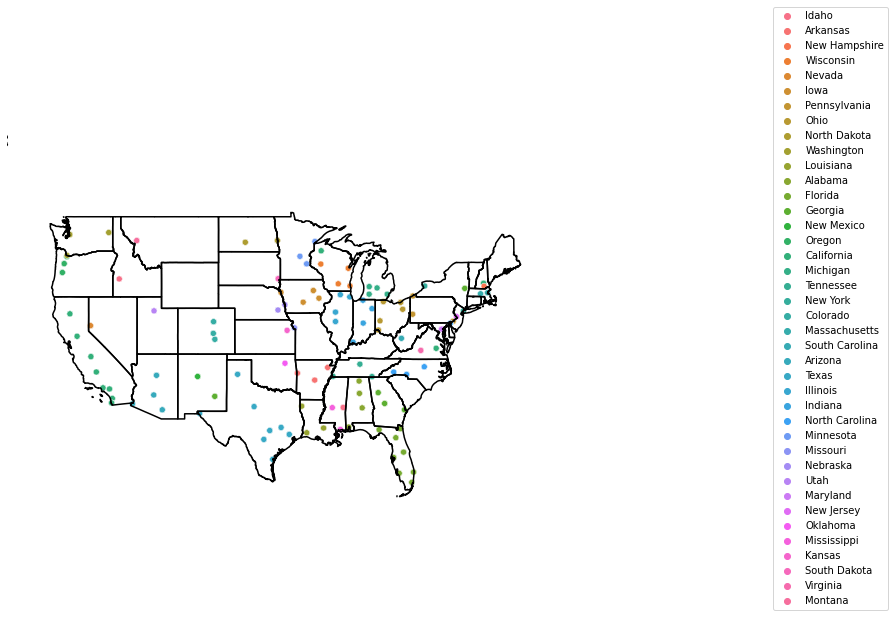

In [8]:
plot_map(sample, col="State", map_file=map_file)

### Animated plot

In [9]:
sample["year"] = sample.Date.apply(lambda x : x.year)


In [10]:
sample["DatePlot"] = sample.Date.apply(lambda x : int(x.year+x.week/100))
sample["DatePlot"] = sample["Date"].dt.to_period('M')

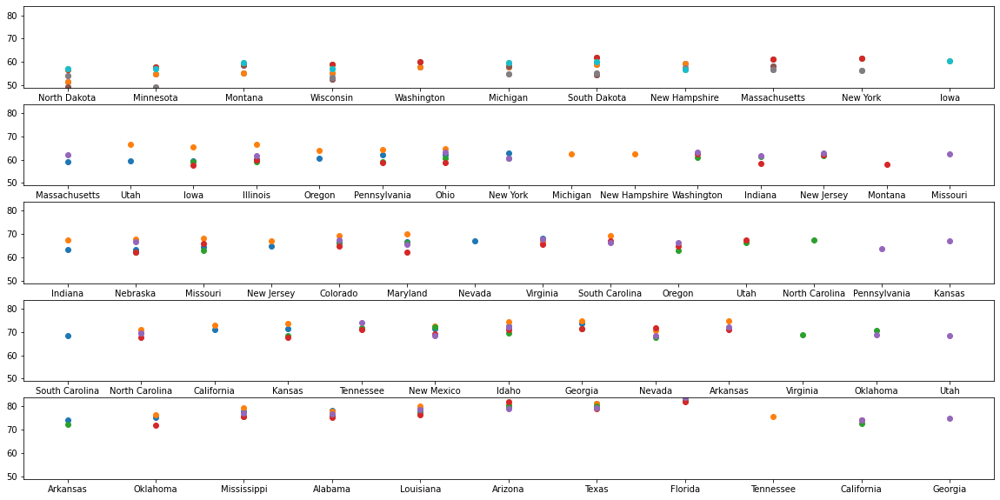

In [152]:
plot_by_state_and_year(sample, "tmax", rows=5) #Also possible for tmax and tmin

In [153]:
px.scatter(sample, x="State", y="tmax", animation_frame="year", animation_group="State",
           size="Median Age", color="State", hover_name="tmax")

In [13]:
animate_map(col="tmax",time_col='DatePlot', df=sample)

## Study by states

In [154]:
fire_size = fires.groupby('STATE_CODE')["FIRE_SIZE"].mean().reset_index()
df = fire_size
col = "FIRE_SIZE"
title = "Average fire size per state"

fig = px.choropleth(df,
                        locations='STATE_CODE', 
                        locationmode="USA-states", 
                        scope="usa",
                        color=col,
                        color_continuous_scale="Viridis_r", 
                        title=title
                        )
fig.show()

In [155]:
fire_size = fires.groupby('STATE_CODE')["FIRE_SIZE"].std().reset_index()
df = fire_size
col = "FIRE_SIZE"
title = "Average fire size per state"

fig = px.choropleth(df,
                        locations='STATE_CODE', 
                        locationmode="USA-states", 
                        scope="usa",
                        color=col,
                        color_continuous_scale="Viridis_r", 
                        title=title
                        )
fig.show()

In [165]:
df_states = fires["STATE_CODE"].value_counts().reset_index().rename(columns={"index":"state_code","STATE_CODE":"count"})

numerical_state_map(df_states, "count", "Number of fire per states")

## Biggest fires

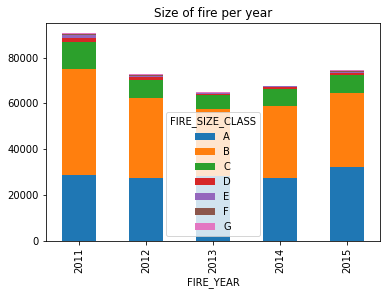

In [21]:
plot_per_year(fires,"FIRE_YEAR", 'FIRE_SIZE_CLASS',  "Size of fire per year")

In [84]:
# Top 5 biggest fires
fires[["FOD_ID", "FIRE_CODE", "FIRE_SIZE"]].sort_values(ascending=False, by="FIRE_SIZE").head()

,FOD_ID,FIRE_CODE,FIRE_SIZE
102805,201508655,G1HG,558198.3
5700,20026006,F4CX,538049.0
101496,201507302,G4ZC,461047.0
96073,201501605,G5Z8,315578.8
68696,201337611,NaN,314444.0


## Study of causes

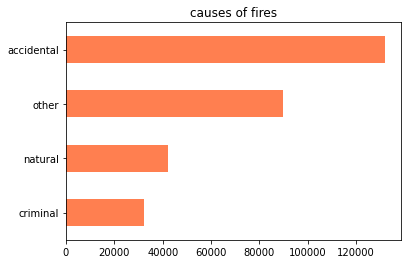

In [18]:
fires['CAUSE_DESCR'].value_counts(ascending=True).plot(kind='barh',color='coral',title='causes of fires')
plt.show()

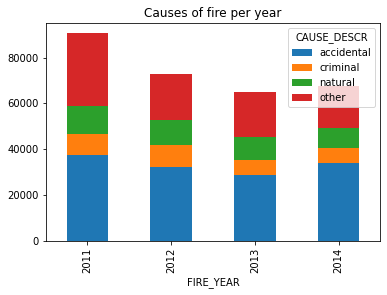

In [20]:
plot_per_year(fires,"FIRE_YEAR", 'CAUSE_DESCR',  "Causes of fire per year")

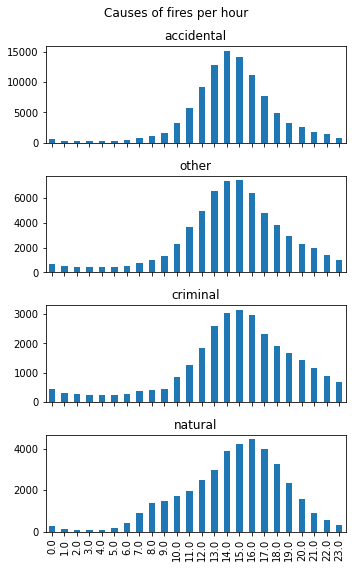

In [157]:
fig,axes = plt.subplots(len(fires["CAUSE_DESCR"].dropna().unique()),1, figsize=(5,8), sharex=True)
axe = axes.ravel()
for i, cause in enumerate(fires["CAUSE_DESCR"].dropna().unique()):
    if isinstance(cause,str):
        fires[fires.CAUSE_DESCR==cause].DISCOVERY_TIME.apply(lambda x : x.hour).value_counts().sort_index().plot(kind="bar", ax=axe[i], title=cause)
    else:
        fires[fires.CAUSE_DESCR.isna()].DISCOVERY_TIME.apply(lambda x : x.hour).value_counts().sort_index().plot(kind="bar", ax=axe[i], title=cause)
    

fig.suptitle("Causes of fires per hour")
fig.tight_layout()

### Distribution of fire sizes

<AxesSubplot:title={'center':'Distribution of log10 size of fires accross the country'}, ylabel='Frequency'>

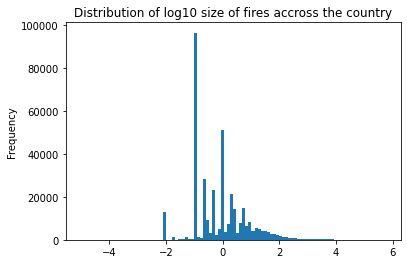

In [80]:
np.log10(fires["FIRE_SIZE"]).plot(kind="hist",bins=100, title="Distribution of log10 size of fires accross the country")

### Benford's law

<AxesSubplot:title={'center':'Distribution of first digits of fire sizes'}>

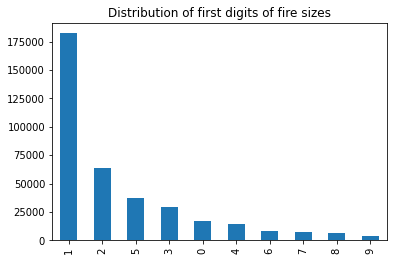

In [164]:
# Check Benford's law : https://en.wikipedia.org/wiki/Benford%27s_law
fires["FIRE_SIZE"].astype('str').apply(lambda x : x[0] if x[0]!="0" else x[2]).value_counts().plot(kind="bar", title="Distribution of first digits of fire sizes")